In [1]:
#Importing required Packages,Libraries and Dataset

import pandas as pd 
import numpy as np
import pandas_profiling as pf
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier as RFC
import sklearn.metrics as mt
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import xgboost as xgb

df=pd.read_csv('C:/Users/anuj/Documents/Anuj/MMA/Maching Learning & AI/OJ.csv')

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1070 entries, 0 to 1069
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      1070 non-null   int64  
 1   Purchase        1070 non-null   object 
 2   WeekofPurchase  1070 non-null   int64  
 3   StoreID         1070 non-null   int64  
 4   PriceCH         1070 non-null   float64
 5   PriceMM         1070 non-null   float64
 6   DiscCH          1070 non-null   float64
 7   DiscMM          1070 non-null   float64
 8   SpecialCH       1070 non-null   int64  
 9   SpecialMM       1070 non-null   int64  
 10  LoyalCH         1070 non-null   float64
 11  SalePriceMM     1070 non-null   float64
 12  SalePriceCH     1070 non-null   float64
 13  PriceDiff       1070 non-null   float64
 14  Store7          1070 non-null   object 
 15  PctDiscMM       1070 non-null   float64
 16  PctDiscCH       1070 non-null   float64
 17  ListPriceDiff   1070 non-null   f

In [3]:
df.describe()

,Unnamed: 0,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
count,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000
mean,535.500000,254.381308,3.959813,1.867421,2.085411,0.051860,0.123364,0.147664,0.161682,0.565782,1.962047,1.815561,0.146486,0.059298,0.027314,0.217991,1.630841
std,309.026698,15.558286,2.308984,0.101970,0.134386,0.117474,0.213834,0.354932,0.368331,0.307843,0.252697,0.143384,0.271563,0.101760,0.062232,0.107535,1.430387
min,1.000000,227.000000,1.000000,1.690000,1.690000,0.000000,0.000000,0.000000,0.000000,0.000011,1.190000,1.390000,-0.670000,0.000000,0.000000,0.000000,0.000000
25%,268.250000,240.000000,2.000000,1.790000,1.990000,0.000000,0.000000,0.000000,0.000000,0.325257,1.690000,1.750000,0.000000,0.000000,0.000000,0.140000,0.000000
50%,535.500000,257.000000,3.000000,1.860000,2.090000,0.000000,0.000000,0.000000,0.000000,0.600000,2.090000,1.860000,0.230000,0.000000,0.000000,0.240000,2.000000
75%,802.750000,268.000000,7.000000,1.990000,2.180000,0.000000,0.230000,0.000000,0.000000,0.850873,2.130000,1.890000,0.320000,0.112676,0.000000,0.300000,3.000000
max,1070.000000,278.000000,7.000000,2.090000,2.290000,0.500000,0.800000,1.000000,1.000000,0.999947,2.290000,2.090000,0.640000,0.402010,0.252688,0.440000,4.000000


In [4]:
#Using PandasProfile package for Data Exploration

pf.ProfileReport(df)

In [5]:
df.head()

,Unnamed: 0,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,1,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.000000,0.000000,0.24,1
1,2,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.150754,0.000000,0.24,1
2,3,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.000000,0.091398,0.23,1
3,4,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.000000,0.000000,0.00,1
4,5,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.000000,0.000000,0.00,0


In [3]:
#Removing PctDiscMM and PctDiscCH from the dataframe as they are highly co-related with DiscMM and DiscCH respectively
df=df.drop(['Unnamed: 0','PctDiscMM','PctDiscCH'],axis=1)

In [7]:
df.head()

,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,ListPriceDiff,STORE
0,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.24,1
1,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.24,1
2,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.23,1
3,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.00,1
4,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.00,0


In [4]:
#Feature engineering 
df['is_discCH']=np.where(df['DiscCH']>0,'1','0')
df['is_discMM']=np.where(df['DiscMM']>0,'1','0')

In [9]:
df.head()

,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,ListPriceDiff,STORE,is_discCH,is_discMM
0,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.24,1,0,0
1,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.24,1,0,1
2,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.23,1,1,0
3,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.00,1,0,0
4,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.00,0,0,0


In [5]:
#Dropping DiscCH and DiscMM from the dataframe
df=df.drop(['DiscCH','DiscMM'],axis=1)

In [11]:
df.head()

,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,ListPriceDiff,STORE,is_discCH,is_discMM
0,CH,237,1,1.75,1.99,0,0,0.500000,1.99,1.75,0.24,No,0.24,1,0,0
1,CH,239,1,1.75,1.99,0,1,0.600000,1.69,1.75,-0.06,No,0.24,1,0,1
2,CH,245,1,1.86,2.09,0,0,0.680000,2.09,1.69,0.40,No,0.23,1,1,0
3,MM,227,1,1.69,1.69,0,0,0.400000,1.69,1.69,0.00,No,0.00,1,0,0
4,CH,228,7,1.69,1.69,0,0,0.956535,1.69,1.69,0.00,Yes,0.00,0,0,0


In [6]:
#Dropping WeekofPurchase feature 
df1=df.drop(['WeekofPurchase'],axis=1)

In [13]:
df1.head()

,Purchase,StoreID,PriceCH,PriceMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,ListPriceDiff,STORE,is_discCH,is_discMM
0,CH,1,1.75,1.99,0,0,0.500000,1.99,1.75,0.24,No,0.24,1,0,0
1,CH,1,1.75,1.99,0,1,0.600000,1.69,1.75,-0.06,No,0.24,1,0,1
2,CH,1,1.86,2.09,0,0,0.680000,2.09,1.69,0.40,No,0.23,1,1,0
3,MM,1,1.69,1.69,0,0,0.400000,1.69,1.69,0.00,No,0.00,1,0,0
4,CH,7,1.69,1.69,0,0,0.956535,1.69,1.69,0.00,Yes,0.00,0,0,0


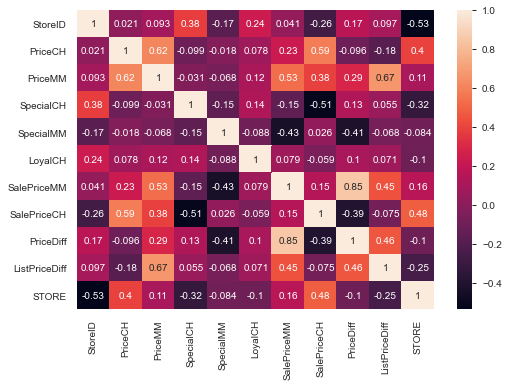

In [7]:
#Co-relation matrix
corrmat=df1.corr(method='pearson')

sn.heatmap(corrmat,annot=True)

plt.show()

In [8]:
#Hot Encoding of Store7 and Purchase feature for successful run of classification algorithm
df1['store7_dummy']=np.where(df1['Store7']=='Yes',1,0)
df1['purchase_dummy']=np.where(df1['Purchase']=='CH',1,0)


In [9]:
#Dropping Purchase and Store7 feature
df2=df1.drop(['Purchase','Store7'],axis=1)


In [17]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1070 entries, 0 to 1069
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   StoreID         1070 non-null   int64  
 1   PriceCH         1070 non-null   float64
 2   PriceMM         1070 non-null   float64
 3   SpecialCH       1070 non-null   int64  
 4   SpecialMM       1070 non-null   int64  
 5   LoyalCH         1070 non-null   float64
 6   SalePriceMM     1070 non-null   float64
 7   SalePriceCH     1070 non-null   float64
 8   PriceDiff       1070 non-null   float64
 9   ListPriceDiff   1070 non-null   float64
 10  STORE           1070 non-null   int64  
 11  is_discCH       1070 non-null   object 
 12  is_discMM       1070 non-null   object 
 13  store7_dummy    1070 non-null   int32  
 14  purchase_dummy  1070 non-null   int32  
dtypes: float64(7), int32(2), int64(4), object(2)
memory usage: 117.2+ KB


In [10]:
#Data type conversion for successful run of classification algorithm
df2['is_discCH']=df2['is_discCH'].astype(str).astype(int)
df2['is_discMM']=df2['is_discMM'].astype(str).astype(int)


In [11]:
#Segregation of target and features into two different dataframes
df2_features=df2.iloc[:,0:13]

df2_target=df2.iloc[:,14]

In [12]:
# Split the data into training and testing datasets
#Given dataset is split into training and testing dataset. Models can be trained on training dataset. The test dataset can be used
#valdiate the performance of the models developed using train dataset. 

train_features, test_features, train_target, test_target = train_test_split(df2_features, df2_target, test_size = 0.25,random_state=42)


In [21]:
#Random Forest Classifier

#Setting up hyperparameter grid for hyperparameter tuning 

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 5, stop = 50, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 20, num = 5)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 3, 4]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
'max_features': max_features,
'max_depth': max_depth,
'min_samples_split': min_samples_split,
'min_samples_leaf': min_samples_leaf,
'bootstrap': bootstrap}

print(random_grid)


{'n_estimators': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 8, 12, 16, 20, None], 'min_samples_split': [2, 3, 4], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True]}


In [22]:
# Random Forest Hyperparameter Tuning using GridSearch cross validation methodology

rf_model = RFC(random_state=42)

rf = GridSearchCV(rf_model,random_grid, cv=3,verbose=3)

# Fit the random search model
rf.fit(train_features, train_target)

Fitting 3 folds for each of 1080 candidates, totalling 3240 fits
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5, score=0.799, total=   0.5s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5, score=0.805, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5, score=0.809, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10, score=0.810, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10, score=0.816, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10, score=0.839, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=15, score=0.795, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=15 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=15, score=0.810, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=15, score=0.824, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=15, score=0.854, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=20, score=0.817, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=20 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.820, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.854, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=25, score=0.813, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=25, score=0.828, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=25 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.820, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.854, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=0.813, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=0.820, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.820, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.858, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=35, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=35, score=0.828, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=35 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.828, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=40, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=40, score=0.824, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=40 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.820, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=45, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=45, score=0.820, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=45 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.820, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.858, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=50, score=0.817, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=50, score=0.820, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=50 


[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.820, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.865, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=5, score=0.799, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=5, score=0.805, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=5 
[CV] 

[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10, score=0.813, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10, score=0.820, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10, score=0.843, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=15, score=0.810, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=15 


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=15, score=0.828, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=15 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=15, score=0.850, total=   0.1s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.802, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.820, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20 


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=20, score=0.828, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=20 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=20, score=0.854, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.817, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.820, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25 


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=25, score=0.854, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.820, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35 


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30, score=0.858, total=   0.2s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.828, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=40 


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=35, score=0.861, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.817, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.820, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=45 


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=40, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.820, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.858, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=50 


[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=45, score=0.858, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.817, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.820, total=   0.4s
[CV] bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.865, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5 
[

[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=5, score=0.802, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=5, score=0.801, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=5, score=0.820, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=10 
[CV]  

[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=10, score=0.776, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=10 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=10, score=0.794, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=10 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=10, score=0.824, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=15 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=15, score=0.787, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=15 


[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=15, score=0.799, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=15, score=0.801, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=15, score=0.861, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=20 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=20, score=0.802, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=20 


[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=20, score=0.813, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=20, score=0.843, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=25 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=25, score=0.806, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=25 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=25, score=0.816, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=25 


[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=25, score=0.816, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=25, score=0.858, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=30 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=30, score=0.810, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=30 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=30, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=30 


[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30, score=0.824, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=30, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=35 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=35, score=0.817, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=35 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=35, score=0.828, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=35 


[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=35, score=0.828, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=35, score=0.843, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=40 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=40, score=0.821, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=40 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=40, score=0.835, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=40 


[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=40, score=0.835, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=40, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=45 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=45, score=0.810, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=45 
[CV]  bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=45, score=0.839, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=45 


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=45, score=0.813, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=45, score=0.839, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, score=0.802, total=   0.6s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, score=0.816, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50 


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=50, score=0.816, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=50, score=0.839, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=5 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=5, score=0.787, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=5 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=5, score=0.794, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=5 
[CV] 

[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=0.799, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=0.801, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=0.854, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=15, score=0.799, total=   0.1s


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=15, score=0.801, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=15, score=0.861, total=   0.1s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=20, score=0.802, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=20, score=0.813, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=20 


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=20, score=0.843, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25, score=0.806, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25, score=0.816, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=25, score=0.858, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30 


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=25, score=0.850, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30, score=0.810, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30, score=0.824, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=30, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=35 


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=30, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35, score=0.817, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35, score=0.828, total=   0.2s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=35, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=40 


[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=35, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=40, score=0.821, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=40, score=0.835, total=   0.5s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=40, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=45 


[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=40, score=0.798, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=45, score=0.784, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=45, score=0.783, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=45, score=0.801, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=45, score=0.824, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=50, score=0.787, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=50, score=0.798, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=50, score=0.820, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=50, score=0.839, total=   0.7s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=5, score=0.780, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=5, score=0.809, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=5, score=0.828, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=10

[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=5, score=0.828, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=10 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=10, score=0.799, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=10 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=10, score=0.805, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=10 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=10, score=0.816, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimato

[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=15, score=0.795, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=15 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=15, score=0.801, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=15 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=15, score=0.850, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=20, score=0.795, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20, score=0.824, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=20, score=0.854, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=25, score=0.784, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=25, score=0.835, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=25, score=0.835, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=25 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=25, score=0.846, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=30, score=0.799, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=30, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=30, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=30 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=30, score=0.846, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=35, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=35, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=35, score=0.790, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=35 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=35, score=0.801, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40, score=0.772, total=   0.6s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=40, score=0.783, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=40, score=0.794, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=40 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=40, score=0.835, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=45, score=0.795, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=45, score=0.798, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=45, score=0.801, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=45 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=45, score=0.839, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=50, score=0.802, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=50, score=0.798, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, score=0.820, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=5, score=0.780, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=5, score=0.809, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=10, score=0.799, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=10 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=10, score=0.805, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=10 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=10, score=0.816, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=15 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=15, score=0.795, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=15, score=0.784, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=15, score=0.831, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=15, score=0.861, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=20, score=0.784, total=   0.1s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=20, score=0.824, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=20, score=0.854, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=25 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=25, score=0.784, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=25 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=25, score=0.835, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=25, score=0.835, total=   0.2s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=25, score=0.846, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30, score=0.799, total=   0.3s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30 
[CV]  bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=30, score=0.843, total=   0.5s
[CV] bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30, score=0.794, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=30, score=0.805, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=35 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=35, score=0.769, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=35 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=35, score=0.787, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=35, score=0.783, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=35, score=0.809, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=40 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=40, score=0.791, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=40 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=40, score=0.787, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=40, score=0.798, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=40, score=0.835, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=45 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=45, score=0.799, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=45 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=45, score=0.801, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=45, score=0.809, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=45, score=0.846, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=50, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=50, score=0.846, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=5 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=5, score=0.791, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=5 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=5, score=0.798, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=

[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=10, score=0.806, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=10, score=0.839, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=10, score=0.865, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=15, score=0.784, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimat

[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=15, score=0.784, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=15, score=0.831, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=15, score=0.869, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=20, score=0.784, total=

[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=20, score=0.784, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=20, score=0.824, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=20, score=0.861, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=25, score=0.787, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=25, score=0.769, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=25, score=0.787, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=25, score=0.801, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=30, score=0.765, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=30, score=0.784, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=30, score=0.787, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=30, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=35, score=0.784, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=35, score=0.799, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=35, score=0.794, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=35, score=0.839, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=40, score=0.802, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40, score=0.801, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=40, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=45, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=45, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=45, score=0.809, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=45, score=0.846, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=50, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=50, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=50, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=50, score=0.846, total=   0.4s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=5, score=0.806, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimator

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=10, score=0.865, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=15, score=0.784, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=15, score=0.831, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=15, score=0.869, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=15, score=0.869, total=   0.1s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20, score=0.784, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20, score=0.824, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=20, score=0.861, total=   0.2s
[CV] bootstrap=True, max_depth=16, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=20, score=0.809, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=25, score=0.769, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=25, score=0.790, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=25, score=0.798, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=25, score=0.824, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=30, score=0.784, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=30, score=0.787, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimators=30, score=0.824, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=30, score=0.839, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=35, score=0.791, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=35, score=0.794, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=35, score=0.839, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=35, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40, score=0.801, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=40, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=40, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=45, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=45, score=0.809, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=45, score=0.846, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=45, score=0.846, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50, score=0.813, total=   0.5s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50, score=0.846, total=   0.8s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=5, score=0.806, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=5, score=0.839, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=5 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=5, score=0.835, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=10

[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=10, score=0.806, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=10 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=10, score=0.839, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=10 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=10, score=0.865, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=15 
[CV]  bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=15, score=0.784, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=15, score=0.769, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=15, score=0.787, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=15, score=0.798, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=20 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=20, score=0.772, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=20, score=0.784, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=20, score=0.794, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=20 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=20, score=0.816, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=25 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=25, score=0.776, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=25, score=0.799, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=25, score=0.790, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=25 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=25, score=0.831, total=   0.2s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=30 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=30, score=0.799, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=0.802, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=35 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=35, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35, score=0.809, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=35, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=40 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=40, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=40, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=40, score=0.801, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=40, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=45 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=45, score=0.806, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=45, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=45, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=45, score=0.850, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, score=0.810, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimat

[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=50, score=0.810, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=5 
[CV]  bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=5, score=0.806, total=   0.1s
[CV] bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimator

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10, score=0.765, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10, score=0.798, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=10, score=0.790, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=15 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=15, score=0.769, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=15, score=0.835, total=   0.2s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.795, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.798, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.831, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.795, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.805, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.835, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=0.802, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.802, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=35 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=35, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.809, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=40 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=40, score=0.806, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.810, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=45 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=45, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.850, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=50 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=3, n_estimators=50, score=0.810, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.810, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=5 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=5, score=0.754, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_spli

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10, score=0.784, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10, score=0.794, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=10, score=0.816, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=15 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=15, score=0.780, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=15, score=0.794, total=   0.2s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=15 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=15, score=0.835, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.795, total=   0.2s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=20, score=0.798, total=   0.2s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=20, score=0.839, total=   0.2s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.795, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.805, total=   0.1s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=25, score=0.835, total=   0.2s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=25, score=0.835, total=   0.2s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.802, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.813, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=30, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=30, score=0.843, total=   0.7s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.806, total=   0.6s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.809, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=35, score=0.850, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=35, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.810, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.843, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=40, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=40, score=0.858, total=   0.3s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.813, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, n_estimators=45, score=0.850, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_sp

[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=45, score=0.850, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.810, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.843, total=   0.4s
[CV] bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50 
[CV]  bootstrap=True, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=50, score=0.843, total=   0.4s


[Parallel(n_jobs=1)]: Done 3240 out of 3240 | elapsed: 13.4min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=42,
                                  

In [23]:
#Understanding best tuned parameters for Random Forest Classifier Model
rf.best_params_

{'bootstrap': True,
 'max_depth': 16,
 'max_features': 'auto',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 10}

In [24]:
#Publishing the Random Forest model with best tuned hyperparameter values
rf.best_estimator_

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=16, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [25]:
#Predicting the type of Juice customer would purchase for test dataset using best tuned Random Forest Classifier model

rf_pred=rf.predict(test_features)

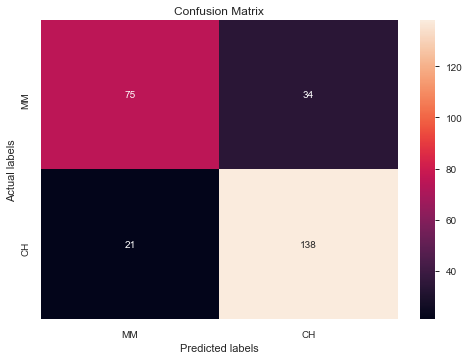

In [26]:
#Publishing the confusion matrix for Random forest classifier model by comparing actuals and predicted outcomes
cm_rf=mt.confusion_matrix(test_target,rf_pred,labels=[0,1])

#CH:1, MM:0
ax= plt.subplot() 
sn.heatmap(cm_rf, annot=True, ax = ax,fmt='g'); #annot=True to annotate cells 
# labels, title and ticks 
ax.set_xlabel('Predicted labels');
ax.set_ylabel('Actual labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['MM', 'CH']); 
ax.yaxis.set_ticklabels(['MM', 'CH']);

In [27]:
#Random Forest AUC Score
mt.roc_auc_score(test_target,rf_pred)

0.7779989613986498

In [58]:
#Random Forest F1 Score
mt.f1_score(test_target,rf_pred)



0.8338368580060423

In [29]:
#Random Forest Precision Score
mt.precision_score(test_target,rf_pred)

0.8023255813953488

In [30]:
#Random Forest Recall Score
mt.recall_score(test_target,rf_pred)

0.8679245283018868

In [13]:
#Support Vector Machine

# Support Vector Machine Hyperparameter Tuning using GridSearch cross validation methodology
svm_grid = {'C': [0.1, 1, 10, 20, 90,100,120], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
svm_model=SVC(random_state=42)  
svm = GridSearchCV(svm_model, svm_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
svm.fit(train_features, train_target)

Fitting 5 folds for each of 35 candidates, totalling 175 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.696, total=   0.5s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.795, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.787, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.775, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.744, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.739, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.820, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.775, total=   0.2s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.806, total=   0.2s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] .

[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.870, total=   0.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.812, total=   0.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.850, total=   0.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.850, total=   0.1s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.752, total=   0.1s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.863, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.781, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] .

[CV] ...... C=90, gamma=0.0001, kernel=rbf, score=0.857, total=   0.1s
[CV] C=90, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=90, gamma=0.0001, kernel=rbf, score=0.769, total=   0.1s
[CV] C=90, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=90, gamma=0.0001, kernel=rbf, score=0.794, total=   0.1s
[CV] C=90, gamma=0.0001, kernel=rbf ..................................
[CV] ...... C=90, gamma=0.0001, kernel=rbf, score=0.800, total=   0.1s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.776, total=   0.1s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.758, total=   0.1s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .......... C=100, gamma=1, kernel=rbf, score=0.775, total=   0.1s
[CV] C=100, gamma=1, kernel=rbf ......................................
[CV] .

[Parallel(n_jobs=1)]: Done 175 out of 175 | elapsed:   16.2s finished


In [14]:
#Understanding best tuned parameters for Support Vector Machine Model 
svm.best_params_

{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}

In [15]:
#Publishing the Support Vector Machine classifier model with best tuned hyperparameter values
svm.best_estimator_

SVC(C=100, gamma=0.001, random_state=42)

In [18]:
#Predicting the type of Juice customer would purchase for test dataset using best tuned Support vector machine model

svm_predictions=svm.predict(test_features)

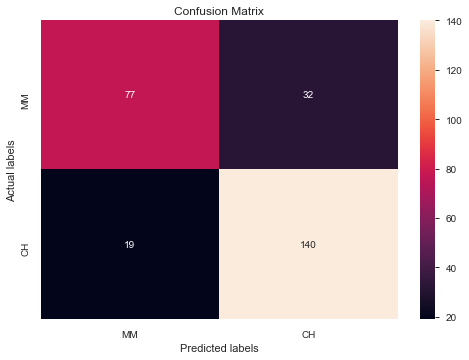

In [19]:
#Publishing the confusion matrix for Support Vector Machine model by comparing actuals and predicted outcomes

cm_svm=mt.confusion_matrix(test_target,svm_predictions,labels=[0,1])

#CH:1, MM:0
ax= plt.subplot() 
sn.heatmap(cm_svm, annot=True, ax = ax,fmt='g'); #annot=True to annotate cells 
# labels, title and ticks 
ax.set_xlabel('Predicted labels');
ax.set_ylabel('Actual labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['MM', 'CH']); 
ax.yaxis.set_ticklabels(['MM', 'CH']);



In [20]:
#Support Vector Machine AUC Score

mt.roc_auc_score(test_target,svm_predictions)

0.793462581501356

In [21]:
#Support Vector Machine F1 Score

mt.f1_score(test_target,svm_predictions)

0.8459214501510575

In [40]:
#Support Vector Machine Precision Score

mt.precision_score(test_target,svm_predictions)

0.813953488372093

In [41]:
#Support Vector Machine Recall score

mt.recall_score(test_target,svm_predictions)

0.8805031446540881

In [42]:
#xgBoost 

#xgBoost Hyperparameter Tuning using GridSearch cross validation methodology

boost_grid = {'nthread': [4], 
              'objective': ['binary:logistic'],
              'learning_rate':[0.02,0.03,0.05,0.1,0.5,0.75],
              'max_depth': [3,5,6,10],
              'subsample':[0.5,0.8,1],
              'colsample_bytree':[0.5,0.7,1],
              'n_estimators':[int(x) for x in np.linspace(start = 5, stop = 100, num = 10)],
        } 
xgb_model=xgb.XGBClassifier(random_state=42)  


xgb = GridSearchCV(xgb_model, boost_grid, refit = True, verbose = 3,cv=3)
  
# fitting the model for grid search
xgb.fit(train_features, train_target)

Fitting 3 folds for each of 2160 candidates, totalling 6480 fits
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   1.5s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.806,

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.4s remaining:    0.0s


[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.810, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total= 

[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.843, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.817, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.831, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0

[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.865, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.824, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.865, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.817, to

[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.806, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.831, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.854, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.810, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.839, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.865, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsam

[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.794, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.810, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, scor

[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.795, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV] 

[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.801, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.839, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.810, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]

[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.861, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.832, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.843, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.869, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813,

[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.850, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.806, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.846, tota

[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.787, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.

[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.854, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.810, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.806, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.846, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_by

[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, s

[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.799, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, sc

[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.843, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.806, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.824, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV

[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.817, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  co

[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.861, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.821, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.873, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.831, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.865, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.810, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.817, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.820, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.843, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, sc

[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.850, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.846, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.816, 

[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.858, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.810, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.805, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=

[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.854, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.791, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8

[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.795, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.05, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.817, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.839, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.865, total=   0.

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.865, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.832, tot

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.831, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816,

[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.846, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.817, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_b

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.821, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.843, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.802, tot

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.839, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.876, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.806, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.820,

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.790, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.839, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.824, total

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.802, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.798, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.8

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.802, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.8

[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.843, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.779, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.83

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.806, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.843, total=   0.

[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.805, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.806, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_byt

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.810, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.802,

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.784, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.801, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.798, t

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.794, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.809, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.780, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.779, total= 

[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_byt

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.772, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.805, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.821,

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.809, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.772, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.790, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.779, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.795, to

[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.783, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.805, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.802, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.779, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, sc

[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.798, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.824, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.806, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsam

[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.809, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.801, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.784, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsampl

[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.795, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.809, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsamp

[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsam

[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.795, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.772, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.821, to

[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.787, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.783, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsamp

[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.790, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.816, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.784, to

[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.835, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.780, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.775, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.843, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.791, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.794, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8

[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.805, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.783, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.81

[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.806, total=   0.1s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.779, total=   0.0s
[CV] colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.5, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, 

[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.880, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.825, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  cols

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.840, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.836, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.876, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.8

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.876, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.836, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.831

[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.832, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.854, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.836, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.825, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8

[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.843, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.821, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  c

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.821, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8

[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.02, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.850, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.880, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.832, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.831, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.880, tota

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.840, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.865, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.825, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.820, 

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.825, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, to

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.816, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.873, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.846, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0

[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.820, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsam

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.825, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.809, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.858, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, 

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.865, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, 

[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.854, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[

[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.854, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.03, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=

[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.873, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.840, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.850, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.888, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.836, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsampl

[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 

[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.820, 

[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.809, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.810, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=

[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.821, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.824, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  co

[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, sc

[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.861, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 

[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.854, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.817, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.836, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.846, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.861, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.836, tot

[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.846, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.865, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.817, total= 

[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.865, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.821, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytre

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.816, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.846, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.817, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.809,

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.810, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.831, tota

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.805, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.861, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.817, tot

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.817, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.802,

[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.832, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.798, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.825, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.861, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.806, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.794, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.880, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, total=   

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.817, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.801, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.809, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.810, tot

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.790, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.787, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.

[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.820, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.772, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.787, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_b

[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.780, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.779, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.835, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total= 

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.802, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.794, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.824, t

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.799, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.783, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.795, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.790, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.839, tota

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.784, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.787, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.5, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.831, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.806,

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.780, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.816

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.794, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.805, 

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.790, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.835, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.799, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.820, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.794, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.809, tota

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.779, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.776, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.810, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.7

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.776, to

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.772, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.768, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.805, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score

[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.775, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.839, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.784, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 

[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.794, total=   0.0s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  col

[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.787, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.790, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.1s
[CV] colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=0.7, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=

[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.835, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.861, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s


[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.809, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, total=   0.0s
[C

[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.876, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.843, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.835,

[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.821, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.816, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.839, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learni

[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.861, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.865, total=

[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.824, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.865, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.816, total= 

[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.832, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.873, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.821, total=   0

[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.846, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=6, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.865, total=  

[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.805, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_byt

[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1,

[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.825, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.02, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.817,

[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.858, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.865, total=  

[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.876, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, 

[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.836,

[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.821, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, 

[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=

[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.861, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.806, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total= 

[CV] colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.821, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytr

[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.809, total=   0.2s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.850, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.840, total=   0.

[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.816, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.865, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.821, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.805,

[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.861, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.816, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=

[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.03, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.843, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.824, total=   0

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.865, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.832, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.831, total=   0.0

[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.832, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=3, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytr

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.817, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.831, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] co

[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytr

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.806, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=5, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.1s
[C

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.865, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s


[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.850, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.825, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.861, total=  

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.805, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.873, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.817, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.801,

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.798, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.846, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.806, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total= 

[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.810, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.846, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.05, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.825, total= 

[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.865, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.832, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_ra

[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, l

[CV] colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=3, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.873, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.836, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning

[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.8, score=0.861, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.865, total=   0.0s
[CV] colsam

[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.5, score=0.854, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.810, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.801, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, l

[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.809, total=   0.0s
[CV] co

[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.839, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.817, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.854, total=   0.0s
[

[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.843, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.801, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_ra

[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=15, nthread=4, objective=binary:logistic, subsample=1, score=0.835, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.825, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.5, score=0.805, total=   0.0

[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.806, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.794, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.839, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree

[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.805, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.839, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.791, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.1, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.820, total=  

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.869, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.817, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=36, nthread=4, objective=binary:logistic, subsample=0.5, score=0.858, total=   0.0s
[

[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.820, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.810, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1, score=0.798, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=3, n_estimators=68, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_ra

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.825, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.831, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=0.8, score=0.858, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=5, nthread=4, objective=binary:logistic, subsample=1, score=0.795, total=   0.0s
[CV] colsa

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=36, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.791, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.787, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=47, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.801, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=0.8, score=0.828, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=5, n_estimators=78, nthread=4, objective=binary:logistic, subsample=1, score=0.787, total=   0.0s
[CV] co

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.5, score=0.861, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.791, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.798, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=15, nthread=4, objective=binary:logistic, subsample=0.8, score=0.820, total=   0.0s

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.794, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=47, nthread=4, objective=binary:logistic, subsample=1, score=0.831, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.787, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.801, total=   0.0s
[CV] 

[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.779, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.809, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.791, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=6, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.779, total=   0.1s
[CV] co

[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.798, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.791, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.783, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytr

[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.816, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.802, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.5, max_depth=10, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, 

[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.772, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.794, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.5, score=0.828, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.780, total=

[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.795, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.794, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=3, n_estimators=89, nthread=4, objective=binary:logistic, subsample=1, score=0.824, total=   0.0s
[CV]

[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.776, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.801, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree

[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.776, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.801, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, lear

[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.765, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.783, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.801, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=5, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.799,

[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.809, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.794, total=   0.0s


[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=57, nthread=4, objective=binary:logistic, subsample=1, score=0.828, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.795, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.798, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1

[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.775, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.5, score=0.798, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.769, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=6, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsamp

[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.801, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=0.8, score=0.813, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.799, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=26, nthread=4, objective=binary:logistic, subsample=1, score=0.779, total= 

[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.791, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.787, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.5, score=0.835, total=   0.0s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=68, nthread=4, objective=binary:logistic, subsample=0.8, score=0.787,

[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.794, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=0.8, score=0.805, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.795, total=   0.1s
[CV] colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1 
[CV]  colsample_bytree=1, learning_rate=0.75, max_depth=10, n_estimators=100, nthread=4, objective=binary:logistic, subsample=1, score=0.787, 

[Parallel(n_jobs=1)]: Done 6480 out of 6480 | elapsed:  4.1min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estim...
                                     validate_parameters=None, verbosity=None),
             iid='deprecated', n_jobs=None,
             param_grid={'colsample_bytree': [0.5, 0.7, 1],
                         'learning_rate': [0.02, 0.03, 0.05, 0.1, 0.5, 0.75],
                     

In [43]:
#Understanding best tuned parameters for xgBoost classifier

xgb.best_params_

{'colsample_bytree': 0.7,
 'learning_rate': 0.03,
 'max_depth': 3,
 'n_estimators': 36,
 'nthread': 4,
 'objective': 'binary:logistic',
 'subsample': 0.8}

In [44]:
#Publishing the xgBoost with best tuned hyperparameter values

xgb.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.03, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=36, n_jobs=4, nthread=4, num_parallel_tree=1,
              objective='binary:logistic', random_state=42, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [45]:
#Predicting the type of Juice customer would purchase for test dataset using xgBoost model


xgb_pred=xgb.predict(test_features)

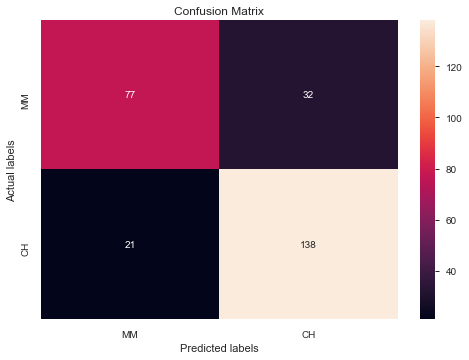

In [46]:
#Publishing the confusion matrix for xgBoost model by comparing actuals and predicted outcomes

cm_xgb=mt.confusion_matrix(test_target,xgb_pred,labels=[0,1])

#CH:1, MM:0
ax= plt.subplot() 
sn.heatmap(cm_xgb, annot=True, ax = ax,fmt='g'); #annot=True to annotate cells 
# labels, title and ticks 
ax.set_xlabel('Predicted labels');
ax.set_ylabel('Actual labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['MM', 'CH']); 
ax.yaxis.set_ticklabels(['MM', 'CH']);



In [47]:
#xgBoost AUC Score

mt.roc_auc_score(test_target,xgb_pred)

0.7871732733252553

In [48]:
#xgBoost F1 Score

mt.f1_score(test_target,xgb_pred)

0.8389057750759878

In [49]:
#xgBoost Precision Score

mt.precision_score(test_target,xgb_pred)

0.8117647058823529

In [50]:
#xgBoost Recall Score

mt.recall_score(test_target,xgb_pred)

0.8679245283018868